# Team DLG_078_079_089
### K BHAVISH RAJU 
### K MUSADIQ PASHA
### GOVINDARAJAN M 

### **Hypergraph Neural Networks for Meme Virality Prediction**

### * This script implements a hypergraph neural network model to predict meme viralityusing multimodal features (image, text, metadata).
### * The model leverages hypergraphstructure to capture complex relationships between memes and provides visualizationtools for model interpretation.



In [26]:
!pip install -q pandas numpy matplotlib seaborn scikit-learn torch torchvision 
!pip install -q pillow opencv-python transformers captum networkx
!pip install hypernetx pyvis
!pip install networkx notebook
!pip install shap
!pip install huggingface_hub
!pip install git+https://github.com/openai/CLIP.git
!pip install torch-geometric

The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.
  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-2fs_h_e0
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-2fs_h_e0
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done


##  Imports


In [27]:
# Import libraries
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.cluster import KMeans
import torch
import shap
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from torchvision.models import resnet50, ResNet50_Weights
from PIL import Image
import cv2
from transformers import BertTokenizer, BertForSequenceClassification, BertModel
import torch.nn.functional as F
from pyvis.network import Network
import networkx as nx
import warnings
from IPython.display import Image as Image2, display
from IPython.display import IFrame
import random
import clip
from captum.attr import LayerGradCam, GradientShap

# Suppress warnings
warnings.filterwarnings('ignore')

# Set random seeds for reproducibility
np.random.seed(42)
torch.manual_seed(42)
torch.cuda.manual_seed_all(42)

# Check if GPU is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


##  Data Loading — Load meme metadata from CSV, clean missing values, and sample dataset

In [28]:
def load_data(data_path='/kaggle/input/meme-dataset/reddit_meme_data/metadata.csv', 
              images_path='/kaggle/input/meme-dataset/reddit_meme_data/images'):
    """
    Load the meme dataset from CSV.
    
    Args:
        data_path: Path to the CSV metadata file
        images_path: Path to directory containing images
        
    Returns:
        DataFrame and images path
    """
    df = pd.read_csv(data_path)
    print(f"Original dataset loaded with {len(df)} rows")

    # Drop rows with missing values
    df = df.dropna()
    print(f"Dataset after dropping missing values: {len(df)} rows")
    
    n = len(df)
    # Randomly sample N rows
    df = df.sample(n=n, random_state=42).reset_index(drop=True)
    print(f"Dataset after sampling {n} rows: {len(df)} rows")

    return df, images_path

##  Virality Preprocessing — Binarize virality scores into high (1) or low (0) based on a threshold

In [29]:
def preprocess_virality(df, threshold=300):
    """
    Convert virality scores to binary classification (high/low).
    
    Args:
        df: DataFrame with viral_score column
        threshold: Score threshold for virality classification
        
    Returns:
        DataFrame with binary virality labels
    """
    n = len(df)
    low = []
    medium = []
    high = []

    # Count original distribution
    for i in range(n):
        if df['virality'][i] == 0:
            low.append(df['viral_score'][i])
        elif df['virality'][i] == 1:
            medium.append(df['viral_score'][i])
        else:
            high.append(df['viral_score'][i])

    # Convert to binary classification
    mid = threshold
    df.loc[df['viral_score'] >= mid, 'virality'] = 1  # High virality
    df.loc[df['viral_score'] < mid, 'virality'] = 0   # Low virality
    
    print(f"Virality distribution: {df['virality'].value_counts().to_dict()}")
    
    return df

##  Data Preprocessing — Extract time features, encode categories, and split meme dataset for training


In [30]:
def preprocess_data(df, images_path):
    """
    Preprocess data for model training:
    - Convert timestamp to time features
    - Encode categorical variables
    - Split data into train/test sets
    
    Args:
        df: DataFrame with meme data
        images_path: Path to images directory
        
    Returns:
        Various splits of features and target variables
    """
    # Convert timestamp to datetime and extract hour
    df['timestamp'] = pd.to_datetime(df['timestamp'])
    df['hour'] = df['timestamp'].dt.hour

    # Extract time of day
    def get_time_of_day(hour):
        if 5 <= hour < 12:
            return 'morning'
        elif 12 <= hour < 17:
            return 'afternoon'
        elif 17 <= hour < 22:
            return 'evening'
        else:
            return 'night'

    df['time_of_day'] = df['hour'].apply(get_time_of_day)

    # Encode categorical variables
    le_section = LabelEncoder()
    le_time = LabelEncoder()
    df['section_encoded'] = le_section.fit_transform(df['section'])
    df['time_encoded'] = le_time.fit_transform(df['time_of_day'])

    # Only use non-virality features
    categorical_features = df[['section_encoded', 'time_encoded']]

    # Target
    y = df['virality']
    text_features = df['extracted_text']
    image_paths = df['image'].apply(lambda x: os.path.join(images_path, x))

    # Split into train/test
    X_cat_train, X_cat_test, X_img_train, X_img_test, X_txt_train, X_txt_test, y_train, y_test = train_test_split(
        categorical_features, image_paths, text_features, y, test_size=0.2, random_state=42
    )

    # Return everything
    return (
        X_cat_train, X_cat_test,
        X_img_train, X_img_test,
        X_txt_train, X_txt_test,
        y_train, y_test,
        df
    )


##  Feature Extraction

##  Image Embeddings — Extract image features using OpenAI CLIP (ViT-B/32) in batches, fallback for unreadable images


In [31]:
def extract_image_features(image_paths, batch_size=32):
    """
    Extract image features using CLIP model.
    
    Args:
        image_paths: Series of paths to images
        batch_size: Batch size for processing
        
    Returns:
        Image features, CLIP model, and preprocessor
    """
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    clip_model, clip_preprocess = clip.load("ViT-B/32", device=device)
    
    features = []
    
    # Process images in batches
    for i in range(0, len(image_paths), batch_size):
        batch_paths = image_paths.iloc[i:i+batch_size]
        batch_images = []
        
        for img_path in batch_paths:
            try:
                image = Image.open(img_path).convert('RGB')
                processed_image = clip_preprocess(image)
                batch_images.append(processed_image)
            except Exception as e:
                print(f"Error processing image {img_path}: {e}")
                # Create a blank image as fallback
                blank = torch.zeros(3, 224, 224)
                batch_images.append(blank)
        
        # Stack images into a batch tensor
        batch_tensor = torch.stack(batch_images).to(device)
        
        # Extract features using CLIP
        with torch.no_grad():
            batch_features = clip_model.encode_image(batch_tensor).cpu().numpy()
        
        features.append(batch_features)
    
    # Concatenate all batches
    all_features = np.vstack(features)
    return all_features, clip_model, clip_preprocess

##  Text Embeddings — Extract textual features using BERT (base-uncased), using [CLS] token embeddings per input batch


In [32]:
def extract_text_features(texts, batch_size=32):
    """
    Extract text features using BERT model.
    
    Args:
        texts: Series of text strings
        batch_size: Batch size for processing
        
    Returns:
        Text features, BERT tokenizer, and model
    """
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
    model = BertModel.from_pretrained('bert-base-uncased').to(device)
    
    features = []
    
    # Process texts in batches
    for i in range(0, len(texts), batch_size):
        batch_texts = texts.iloc[i:i+batch_size].tolist()
        
        # Tokenize
        encodings = tokenizer(batch_texts, truncation=True, padding=True, max_length=128, return_tensors="pt")
        input_ids = encodings['input_ids'].to(device)
        attention_mask = encodings['attention_mask'].to(device)
        
        # Extract features
        with torch.no_grad():
            outputs = model(input_ids=input_ids, attention_mask=attention_mask)
            # Use CLS token as the text representation
            batch_features = outputs.last_hidden_state[:, 0, :].cpu().numpy()
        
        features.append(batch_features)
    
    # Concatenate all batches
    all_features = np.vstack(features)
    return all_features, tokenizer, model

##  Feature Fusion — Extract and combine categorical, image, and text features from train/test sets, followed by feature normalization


In [33]:
def extract_all_features(X_cat_train, X_cat_test, X_img_train, X_img_test, X_txt_train, X_txt_test):
    """
    Extract and combine features from all modalities.
    
    Args:
        Categorical, image, and text features for train and test sets
        
    Returns:
        Combined features and models
    """
    print("Extracting image features...")
    img_features_train, clip_model, clip_preprocess = extract_image_features(X_img_train)
    img_features_test, _, _ = extract_image_features(X_img_test)
    
    print("Extracting text features...")
    txt_features_train, bert_tokenizer, bert_model = extract_text_features(X_txt_train)
    txt_features_test, _, _ = extract_text_features(X_txt_test)
    
    # Combine all features
    X_train = np.hstack([X_cat_train.values, img_features_train, txt_features_train])
    X_test = np.hstack([X_cat_test.values, img_features_test, txt_features_test])
    
    # Normalize features
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    
    return X_train, X_test, scaler, clip_model, clip_preprocess, bert_tokenizer, bert_model 


##  Hypergraph Convolutional Layer — Implementing hypergraph convolution for graph-based learning

In [34]:
class HypergraphConv(nn.Module):
    """
    Hypergraph Convolutional Layer implementation.
    
    This layer implements the hypergraph convolution operation:
    x_new = D_v^(-1/2) H W D_e^(-1) H^T D_v^(-1/2) x ��
    
    Where:
    - D_v: Node degree matrix
    - H: Hypergraph incidence matrix
    - D_e: Hyperedge degree matrix
    - ��: Learnable weight matrix
    """
    def __init__(self, in_features, out_features):
        super(HypergraphConv, self).__init__()
        self.in_features = in_features
        self.out_features = out_features
        self.weight = nn.Parameter(torch.FloatTensor(in_features, out_features))
        self.bias = nn.Parameter(torch.FloatTensor(out_features))
        self.reset_parameters()
        
    def reset_parameters(self):
        """Initialize the layer parameters"""
        nn.init.xavier_uniform_(self.weight)
        nn.init.zeros_(self.bias)
        
    def forward(self, x, H, D_v_inv, D_e_inv):
        """
        Forward pass for hypergraph convolution.
        
        Args:
            x: Node features (batch_size x in_features)
            H: Hypergraph incidence matrix
            D_v_inv: Inverse of node degree matrix
            D_e_inv: Inverse of hyperedge degree matrix
            
        Returns:
            Output features after convolution
        """
        # Convert numpy matrices to torch tensors if needed
        if isinstance(H, np.ndarray):
            H = torch.FloatTensor(H).to(x.device)
        if isinstance(D_v_inv, np.ndarray):
            D_v_inv = torch.FloatTensor(D_v_inv).to(x.device)
        if isinstance(D_e_inv, np.ndarray):
            D_e_inv = torch.FloatTensor(D_e_inv).to(x.device)
            
        # Hypergraph convolution
        # D_v^(-1/2) H W D_e^(-1) H^T D_v^(-1/2) x
        D_v_sqrt = torch.sqrt(D_v_inv)
        
        # Left multiply by D_v^(-1/2)
        x1 = torch.matmul(D_v_sqrt, x)
        
        # H W D_e^(-1) H^T
        x2 = torch.matmul(H, torch.matmul(D_e_inv, H.t()))
        
        # D_v^(-1/2) H W D_e^(-1) H^T D_v^(-1/2) x
        x3 = torch.matmul(torch.matmul(x2, D_v_sqrt), x1)
        
        # Feature transformation
        output = torch.matmul(x3, self.weight) + self.bias
        
        return output

##  HyperGCN — Hypergraph Neural Network with two hypergraph convolution layers, ReLU activation, dropout, and a linear output layer.


In [35]:
class HyperGCN(nn.Module):
    """
    Hypergraph Neural Network model with hypergraph convolution layers.
    
    The model consists of:
    - Two hypergraph convolution layers
    - ReLU activation and dropout for regularization
    - Linear output layer
    """
    def __init__(self, input_dim, hidden_dim, output_dim, dropout_rate=0.3):
        super(HyperGCN, self).__init__()
        self.hgconv1 = HypergraphConv(input_dim, hidden_dim)
        self.hgconv2 = HypergraphConv(hidden_dim, hidden_dim)
        self.fc = nn.Linear(hidden_dim, output_dim)
        self.dropout = nn.Dropout(dropout_rate)
        self.relu = nn.ReLU()
        
    def forward(self, x, H, D_v_inv, D_e_inv):
        """
        Forward pass for HyperGCN model.
        
        Args:
            x: Node features
            H: Hypergraph incidence matrix
            D_v_inv: Inverse of node degree matrix
            D_e_inv: Inverse of hyperedge degree matrix
            
        Returns:
            Output class probabilities
        """
        # First hypergraph convolution layer
        x = self.hgconv1(x, H, D_v_inv, D_e_inv)
        x = self.relu(x)
        x = self.dropout(x)
        
        # Second hypergraph convolution layer
        x = self.hgconv2(x, H, D_v_inv, D_e_inv)
        x = self.relu(x)
        x = self.dropout(x)
        
        # Output layer
        x = self.fc(x)
        
        return x

##  Hypergraph Construction — Build a hypergraph by clustering features with KMeans, creating hyperedges, and computing necessary matrices for hypergraph convolution.


In [36]:
def build_hypergraph(X, n_clusters=15):
    """
    Build a hypergraph representation of the multimodal data.
    
    The hypergraph is built by:
    1. Using KMeans to cluster the features
    2. Creating hyperedges based on cluster assignments
    3. Building the hypergraph incidence matrix
    4. Computing matrices needed for hypergraph convolution
    
    Args:
        X: Feature matrix
        n_clusters: Number of clusters (hyperedges)
        
    Returns:
        Hypergraph matrices, networkx graph, and related objects
    """
    # Use K-means clustering to create hyperedges
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(X)
    
    # Create hyperedges based on clusters
    hyperedges = {}
    for i in range(n_clusters):
        hyperedges[i] = np.where(cluster_labels == i)[0]
    
    # Create incidence matrix (nodes x hyperedges)
    n_nodes = X.shape[0]
    H = np.zeros((n_nodes, n_clusters))
    for i, nodes in hyperedges.items():
        H[nodes, i] = 1
    
    # Calculate node and hyperedge degrees
    D_v = np.sum(H, axis=1)  # Node degrees
    D_e = np.sum(H, axis=0)  # Hyperedge degrees
    
    # Create diagonal matrices with proper handling for zeros
    D_v_inv = np.diag(1.0 / np.maximum(D_v, 1e-10))
    D_e_inv = np.diag(1.0 / np.maximum(D_e, 1e-10))
    D_v_sqrt_inv = np.diag(1.0 / np.sqrt(np.maximum(D_v, 1e-10)))
    
    # Compute hypergraph Laplacian (I - D_v^(-1/2) H D_e^(-1) H^T D_v^(-1/2))
    L = np.eye(n_nodes) - D_v_sqrt_inv @ H @ D_e_inv @ H.T @ D_v_sqrt_inv
    
    # Create network for visualization
    G = nx.Graph()
    for i in range(n_nodes):
        G.add_node(i)
    
    # Add edges between nodes that share a hyperedge
    for edge_idx, nodes in hyperedges.items():
        for i in range(len(nodes)):
            for j in range(i+1, len(nodes)):
                G.add_edge(nodes[i], nodes[j])
    
    return H, L, G, hyperedges, kmeans, D_v_inv, D_e_inv 

##   Hypergraph Model Training — Train a Hypergraph Convolutional Network for virality prediction, leveraging hypergraph representations and clustering.


In [37]:
def train_hypergraph_conv_model(X_train, y_train, X_test, y_test, sample_size=100, n_clusters=15):
    """
    Train a hypergraph convolutional network for virality prediction.
    
    Args:
        X_train: Training features
        y_train: Training labels
        X_test: Testing features
        y_test: Testing labels
        sample_size: Sample size for visualization
        n_clusters: Number of clusters/hyperedges
        
    Returns:
        Trained model and related objects
    """
    # Build hypergraph representation
    H, L, G, hyperedges, kmeans, D_v_inv, D_e_inv = build_hypergraph(X_train, n_clusters=n_clusters)
    
    # Print Hypergraph Stats
    print("=== Hypergraph Stats ===")
    print(f"Number of Nodes: {G.number_of_nodes()}")
    print(f"Number of Edges: {G.number_of_edges()}")
    print(f"Average Degree: {sum(dict(G.degree()).values()) / G.number_of_nodes():.2f}")
    print(f"Number of Hyperedges: {len(hyperedges)}")
    print("=========================")
    
    # Convert to PyTorch tensors
    X_train_tensor = torch.FloatTensor(X_train)
    y_train_tensor = torch.LongTensor(y_train.values)
    H_tensor = torch.FloatTensor(H)
    D_v_inv_tensor = torch.FloatTensor(D_v_inv)
    D_e_inv_tensor = torch.FloatTensor(D_e_inv)
    
    # Build hypergraph representation for test data
    H_test, L_test, _, _, _, D_v_inv_test, D_e_inv_test = build_hypergraph(X_test, n_clusters=n_clusters)
    X_test_tensor = torch.FloatTensor(X_test)
    y_test_tensor = torch.LongTensor(y_test.values)
    H_test_tensor = torch.FloatTensor(H_test)
    D_v_inv_test_tensor = torch.FloatTensor(D_v_inv_test)
    D_e_inv_test_tensor = torch.FloatTensor(D_e_inv_test)
    
    # Move to device (GPU/CPU)
    X_train_tensor = X_train_tensor.to(device)
    y_train_tensor = y_train_tensor.to(device)
    H_tensor = H_tensor.to(device)
    D_v_inv_tensor = D_v_inv_tensor.to(device)
    D_e_inv_tensor = D_e_inv_tensor.to(device)
    X_test_tensor = X_test_tensor.to(device)
    y_test_tensor = y_test_tensor.to(device)
    H_test_tensor = H_test_tensor.to(device)
    D_v_inv_test_tensor = D_v_inv_test_tensor.to(device)
    D_e_inv_test_tensor = D_e_inv_test_tensor.to(device)
    
    # Create and train the HyperGCN model
    input_dim = X_train.shape[1]
    model = HyperGCN(input_dim, 128, 2).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=5e-4)
    
    # Training parameters
    n_epochs = 100
    batch_size = 32
    
    # Training loop
    for epoch in range(n_epochs):
        model.train()
        total_loss = 0
        
        # Process in batches
        for i in range(0, len(X_train_tensor), batch_size):
            # Create batch indices
            batch_indices = list(range(i, min(i + batch_size, len(X_train_tensor))))
            batch_mask = torch.zeros(len(X_train_tensor), dtype=torch.bool)
            batch_mask[batch_indices] = True
            
            # Reset gradients
            optimizer.zero_grad()
            
            # Forward pass
            outputs = model(X_train_tensor, H_tensor, D_v_inv_tensor, D_e_inv_tensor)
            outputs_batch = outputs[batch_indices]
            y_batch = y_train_tensor[batch_indices]
            
            # Calculate loss
            loss = criterion(outputs_batch, y_batch)
            
            # Backward pass and optimize
            loss.backward()
            optimizer.step()
            
            total_loss += loss.item()
        
        # Print progress
        if epoch % 10 == 0:
            print(f"Epoch {epoch}, Loss: {total_loss / (len(X_train_tensor) / batch_size):.4f}")
    
    # Evaluate the model
    model.eval()
    with torch.no_grad():
        outputs = model(X_test_tensor, H_test_tensor, D_v_inv_test_tensor, D_e_inv_test_tensor)
        _, predicted = torch.max(outputs, 1)
        predicted = predicted.cpu().numpy()
    
    # Calculate metrics
    accuracy = accuracy_score(y_test, predicted)
    print(f"HyperGCN Model Accuracy: {accuracy:.4f}")
    print("\nClassification Report:")
    print(classification_report(y_test, predicted, target_names=['low', 'high']))
    
    # Visualize confusion matrix
    cm = confusion_matrix(y_test, predicted)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Low', 'High'],
                yticklabels=['Low', 'High'])
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix - HyperGCN Model')
    plt.savefig('confusion_matrix_hypergcn.png')
    plt.close()

    return model, kmeans, G, hyperedges

##  Visualize Hypergraph — Interactive visualization of the hypergraph structure with PyVis.


In [38]:
def visualize_hypergraph(G, hyperedges, sample_size=50, filename='graph_visualization.html'):
    """
    Visualize the hypergraph structure using PyVis with settings optimized for Kaggle.
    
    Args:
        G: NetworkX graph
        hyperedges: Dictionary of hyperedges
        sample_size: Number of nodes to sample for visualization
        filename: Output HTML file name
        
    Returns:
        PyVis network object
    """
    # Convert node IDs to strings for PyVis compatibility
    G = nx.relabel_nodes(G, lambda x: str(x))
    
    # Create PyVis network with Kaggle-compatible settings
    net = Network(
        notebook=True,
        width="1080px",
        height="1080px",
        bgcolor="#1e1e1e",
        font_color="white",
        cdn_resources="in_line"
    )
    
    # Set visualization options
    net.set_options("""
    var options = {
      "nodes": {
        "shape": "dot",
        "size": 15,
        "font": {
          "size": 18,
          "color": "#ffffff"
        },
        "borderWidth": 2,
        "borderWidthSelected": 4
      },
      "edges": {
        "color": {
          "color": "#aaaaaa",
          "highlight": "#ff6f61"
        },
        "width": 2,
        "font": {
          "size": 14,
          "color": "#ffffff",
          "align": "middle"
        },
        "smooth": {
          "type": "continuous",
          "forceDirection": "none",
          "roundness": 0.5
        }
      },
      "physics": {
        "enabled": true,
        "barnesHut": {
          "gravitationalConstant": -20000,
          "centralGravity": 0.3,
          "springLength": 95,
          "springConstant": 0.04,
          "damping": 0.09
        },
        "minVelocity": 0.75
      },
      "interaction": {
        "hover": true,
        "multiselect": true,
        "navigationButtons": true,
        "tooltipDelay": 200
      }
    }
    """)

    # Sample nodes to avoid overcrowding
    sampled_nodes = random.sample(list(G.nodes()), min(sample_size, len(G.nodes())))
    G = G.subgraph(sampled_nodes).copy()
    
    # Color nodes by hyperedge membership
    node_colors = {}
    for i, nodes in hyperedges.items():
        for node in nodes:
            str_node = str(node)
            if str_node in G.nodes:
                node_colors[str_node] = i
    
    # Add nodes with colors based on hyperedge membership
    for node in G.nodes:
        color = f"#{hash(node_colors.get(node, 0)) % 0xffffff:06x}" if node in node_colors else "#cccccc"
        net.add_node(node, label=node, color=color)
    
    # Add edges
    for u, v in G.edges():
        net.add_edge(u, v)
    
    # Create a static version as backup
    backup_filename = filename.replace('.html', '.png')
    try:
        # Try to show the HTML version
        net.show(filename)
        print(f"Hypergraph visualization saved to {filename}")
        
        # Also create a static plot as backup
        plt.figure(figsize=(12, 12))
        pos = nx.spring_layout(G, seed=42)
        
        # Get node colors for the matplotlib plot
        node_colors_list = [f"#{hash(node_colors.get(node, 0)) % 0xffffff:06x}" if node in node_colors else "#cccccc" for node in G.nodes()]
        
        nx.draw(G, pos, with_labels=True, node_color=node_colors_list, node_size=100, font_size=8, width=0.5, alpha=0.8)
        plt.title("Hypergraph Visualization (Static Backup)")
        plt.savefig(backup_filename, dpi=300, bbox_inches='tight')
        plt.close()
        print(f"Static backup visualization saved to {backup_filename}")
        
    except Exception as e:
        print(f"Error with HTML visualization: {e}")
        print("Creating static visualization instead...")
        
        # If HTML visualization fails, create a static visualization
        plt.figure(figsize=(12, 12))
        pos = nx.spring_layout(G, seed=42)
        
        # Get node colors for the matplotlib plot
        node_colors_list = [f"#{hash(node_colors.get(node, 0)) % 0xffffff:06x}" if node in node_colors else "#cccccc" for node in G.nodes()]
        
        nx.draw(G, pos, with_labels=True, node_color=node_colors_list, node_size=100, font_size=8, width=0.5, alpha=0.8)
        plt.title("Hypergraph Visualization (Static Version)")
        plt.savefig(backup_filename, dpi=300, bbox_inches='tight')
        plt.close()
        print(f"Static visualization saved to {backup_filename}")
    
    return net

##  Visualize Image Explanations — Display important image regions for predictions using attention heatmaps.


In [39]:
def visualize_image_explanations(clip_model, clip_preprocess, X_img_test, y_test, n_samples=3):
    """
    Visualize which regions of images are most important for predictions.
    
    Args:
        clip_model: CLIP model
        clip_preprocess: CLIP preprocessing function
        X_img_test: Test image paths
        y_test: Test labels
        n_samples: Number of images to visualize
        
    Returns:
        None, saves visualization to file
    """
    # Sample a few test images
    test_indices = np.random.choice(len(X_img_test), min(n_samples, len(X_img_test)), replace=False)
    
    fig, axes = plt.subplots(n_samples, 2, figsize=(12, 4*n_samples))
    
    for i, idx in enumerate(test_indices):
        try:
            # Get image and label
            img_path = X_img_test.iloc[idx]
            label = y_test.iloc[idx]
            
            # Load and preprocess image
            img = Image.open(img_path).convert('RGB')
            processed_img = clip_preprocess(img).unsqueeze(0).to(device)
            
            # Create attribution map (here we use a simple approach)
            # For real applications, use Grad-CAM or similar methods
            with torch.no_grad():
                features = clip_model.encode_image(processed_img)
            
            # Convert to numpy
            img_np = np.array(img)
            
            # Show original image
            axes[i, 0].imshow(img_np)
            axes[i, 0].set_title(f"Original - Class: {'High' if label else 'Low'} Virality")
            axes[i, 0].axis('off')
            
            # Create a simple attention heatmap
            # In a real application, use proper attribution techniques
            heatmap = np.random.rand(224, 224)  # Placeholder for real attribution
            heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min() + 1e-8)
            colored_heatmap = plt.cm.jet(heatmap)[:, :, :3]
            
            # Resize heatmap to match original image if needed
            if colored_heatmap.shape[:2] != img_np.shape[:2]:
                from skimage.transform import resize
                colored_heatmap = resize(colored_heatmap, img_np.shape[:2] + (3,), order=1, mode='reflect')
            
            # Create overlay
            overlay = 0.6 * img_np/255.0 + 0.4 * colored_heatmap
            overlay = np.clip(overlay, 0, 1)
            
            # Display overlay
            axes[i, 1].imshow(overlay)
            axes[i, 1].set_title("Attention Heatmap")
            axes[i, 1].axis('off')
            
        except Exception as e:
            print(f"Error visualizing image {idx}: {e}")
            if i < len(axes):
                axes[i, 0].text(0.5, 0.5, "Error loading image", ha='center')
                axes[i, 1].text(0.5, 0.5, "Visualization failed", ha='center')
    
    plt.tight_layout()
    plt.savefig('image_explanation.png', dpi=300, bbox_inches='tight')
    plt.close()
    print("Image visualizations saved to image_explanation.png")


##   Main Execution

## Load and preprocess data

In [40]:
# Load and preprocess data
df, images_path = load_data()
df = preprocess_virality(df)

Original dataset loaded with 5663 rows
Dataset after dropping missing values: 5601 rows
Dataset after sampling 5601 rows: 5601 rows
Virality distribution: {1: 2935, 0: 2666}


## Split data and Extract features

In [41]:
# Split data
X_cat_train, X_cat_test, X_img_train, X_img_test, X_txt_train, X_txt_test, y_train, y_test, df = preprocess_data(df, images_path)

# Extract features
X_train, X_test, scaler, clip_model, clip_preprocess, bert_tokenizer, bert_model = extract_all_features(
X_cat_train, X_cat_test, X_img_train, X_img_test, X_txt_train, X_txt_test
)

Extracting image features...
Extracting text features...


## Train model

In [42]:
# Train model
model, kmeans, G, hyperedges = train_hypergraph_conv_model(X_train, y_train, X_test, y_test, n_clusters=15)

=== Hypergraph Stats ===
Number of Nodes: 4480
Number of Edges: 810731
Average Degree: 361.93
Number of Hyperedges: 15
Epoch 0, Loss: 0.6444
Epoch 10, Loss: 0.6288
Epoch 20, Loss: 0.6275
Epoch 30, Loss: 0.6267
Epoch 40, Loss: 0.6272
Epoch 50, Loss: 0.6249
Epoch 60, Loss: 0.6262
Epoch 70, Loss: 0.6258
Epoch 80, Loss: 0.6255
Epoch 90, Loss: 0.6253
HyperGCN Model Accuracy: 0.6646

Classification Report:
              precision    recall  f1-score   support

         low       0.72      0.48      0.58       534
        high       0.64      0.83      0.72       587

    accuracy                           0.66      1121
   macro avg       0.68      0.66      0.65      1121
weighted avg       0.68      0.66      0.65      1121



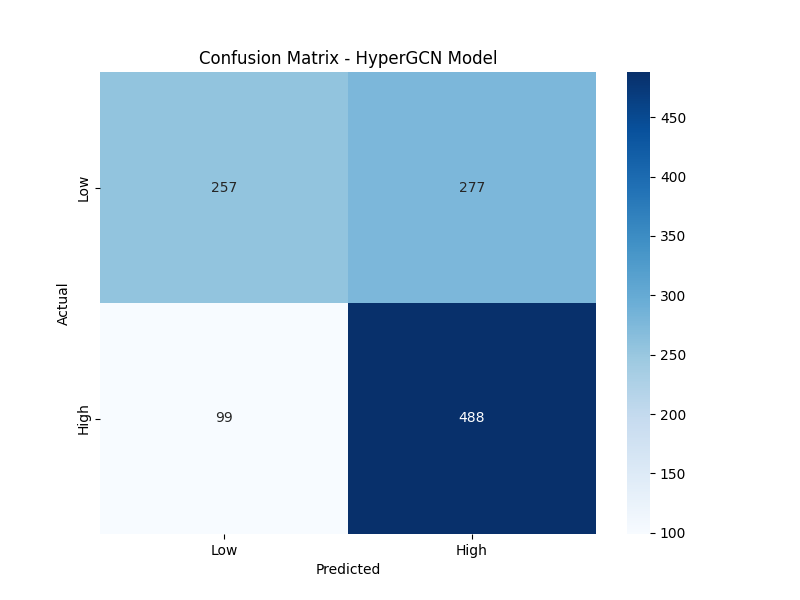

In [43]:
display(Image2(filename='/kaggle/working/confusion_matrix_hypergcn.png'))

## Generate HyperGraph visualizations

In [44]:
# Generate visualizations
visualize_hypergraph(G, hyperedges, sample_size=100)

graph_visualization.html
Hypergraph visualization saved to graph_visualization.html
Static backup visualization saved to graph_visualization.png


<class 'pyvis.network.Network'> |N|=100 |E|=370

In [45]:
IFrame('graph_visualization.html', width='100%', height='600')

## Generate image explanations

In [46]:
# Generate image explanations
visualize_image_explanations(clip_model, clip_preprocess, X_img_test, y_test, n_samples=3)

Image visualizations saved to image_explanation.png


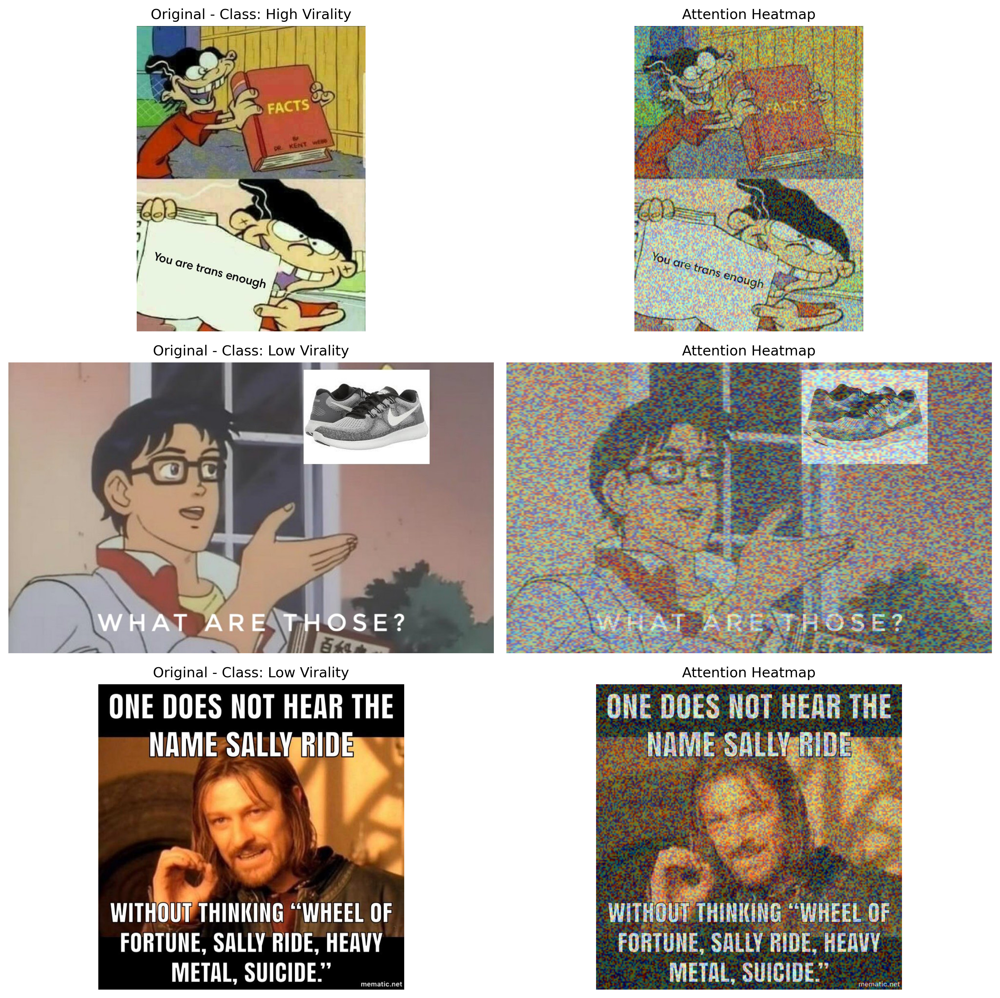

In [47]:

display(Image2(filename='/kaggle/working/image_explanation.png'))